<a href="https://colab.research.google.com/github/RafaelNovais/Python/blob/master/ucc_ai_quest_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%capture
!pip install cloud-tpu-client https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.13-cp38-cp38m-linux_x86_64.whl
!pip install lightning albumentations matplotlib
!git clone https://github.com/ReML-AI/ucc-ai-quest-baseline.git baseline
!unzip -n ./baseline/data/warmup.zip

In [ ]:
import sys
sys.path.append('./baseline')

In [ ]:
import os
import torch
import json
import random
import lightning.pytorch as pl
from tqdm import tqdm
from pathlib import Path
from PIL import Image
from albumentations.pytorch import ToTensorV2
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning import seed_everything
from datasets import SegDataModule, SegDataset
from models import SegModel
from utils import mask_to_rle, show_in_grid, mask_to_rgb
from metrics import SMAPIoUMetric

In [ ]:
seed_everything(2023)

INFO: Seed set to 2023
INFO:lightning.fabric.utilities.seed:Seed set to 2023


2023

### Example of random images and corresponding masks from the dataset

Load some random images and corresponding masks

In [ ]:
IMG_DIR = Path("./warmup/img/train/")
ANN_DIR = Path("./warmup/ann/train/")

imgs = [IMG_DIR / i for i in random.sample(os.listdir(IMG_DIR), 5)]
anns = [ANN_DIR / f"{Path(img).stem}.png" for img in imgs]

imgs = [Image.open(img) for img in imgs]
anns = [mask_to_rgb(Image.open(ann), {1: [55, 125, 34]}) for ann in anns] # convert label 1 to green (55, 125, 34)
imgs.extend(anns)

Display images in the first row and the corresponding masks in the second row

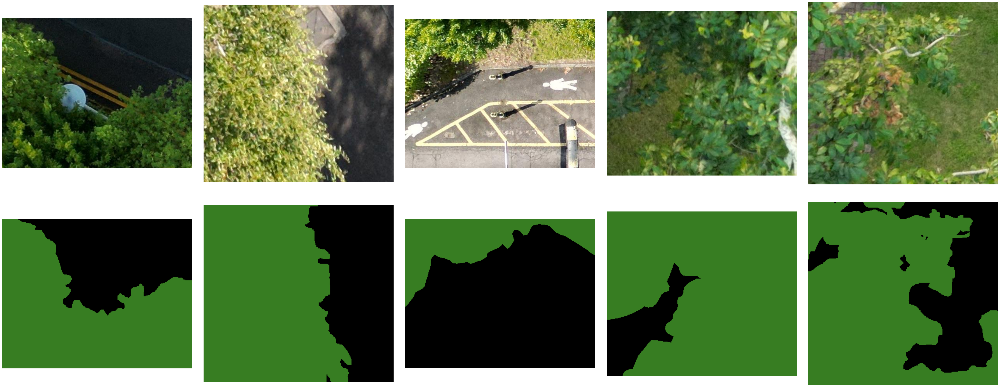

In [ ]:
show_in_grid(imgs, num_rows=2, num_cols=int(len(imgs) / 2), show_plot=True)

### Create datamodule object

In [ ]:
datamodule = SegDataModule(root_dir=".", phase="warmup", batch_size=8)

### Create a segmentation model object

In [ ]:
model = SegModel()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 69.0MB/s]


### Create a trainer object

In [ ]:
checkpoint_callback = ModelCheckpoint(
        dirpath="checkpoints",
        monitor="val_high_vegetation_IoU",
        mode="max",
        filename="bestmodel",
        save_top_k=1,
    )

trainer = pl.Trainer(max_epochs=10, callbacks=[checkpoint_callback], log_every_n_steps=10)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


### Start training
The trainer will monitor `val_high_vegetation_IoU` metric and automatically save

In [ ]:
trainer.fit(model, datamodule=datamodule)

INFO: 
  | Name      | Type             | Params
-----------------------------------------------
0 | net       | FCN              | 32.9 M
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
32.9 M    Trainable params
0         Non-trainable params
32.9 M    Total params
131.789   Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | net       | FCN              | 32.9 M
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
32.9 M    Trainable params
0         Non-trainable params
32.9 M    Total params
131.789   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

### Predict results from the best model checkpoint and generate submission file

Load model from checkpoint

In [ ]:
loaded_model = SegModel.load_from_checkpoint("./checkpoints/bestmodel.ckpt")
loaded_model.eval();

We use the class SegDataset directly, instead of SegDataModule because we need access to the list of image file names

In [ ]:
ds = SegDataset(root_dir=".", phase="warmup", split="valid", transform=ToTensorV2())
results = {}

We loop through each sample in the dataset, use the loaded model to make prediction. The prediction, which is a binary mask of `m x n` dimension, is converted to Run-length encoding format using the `mask_to_rle` function.

In [ ]:
images = []
anns = []
preds = []

for i, batch in tqdm(enumerate(ds), total=len(ds), desc="Inferencing"):
  filename = ds.img_list[i]
  img, ann = batch
  out = model(img.float().unsqueeze(dim=0).to(model.device))['out']
  probs = torch.softmax(out, dim=1)
  pred = torch.argmax(probs, dim=1)
  pred = pred.detach().cpu().numpy().squeeze()

  images.append(img.cpu().numpy().transpose(1, 2, 0))
  anns.append(ann.cpu().numpy())
  preds.append(pred)

  rle = mask_to_rle(pred)

  results[filename] = {
      "counts": rle,
      "height": pred.shape[0],
      "width": pred.shape[1],
  }

Inferencing: 100%|██████████| 111/111 [06:53<00:00,  3.73s/it]


We dump the results object to the `results.json` file

In [ ]:
with open ('results.json', 'w') as f:
  json.dump(results, f)

Finally, we zip the `results.json` file. You can submit the `results.zip` file to Codalab now, good luck!!

In [ ]:
!zip results.zip results.json

  adding: results.json (deflated 63%)


### Visualize ground truth masks and predictions for comparison (Optional)

The ground truth masks are displayed on the second row. The predictions are displayed on the third row.

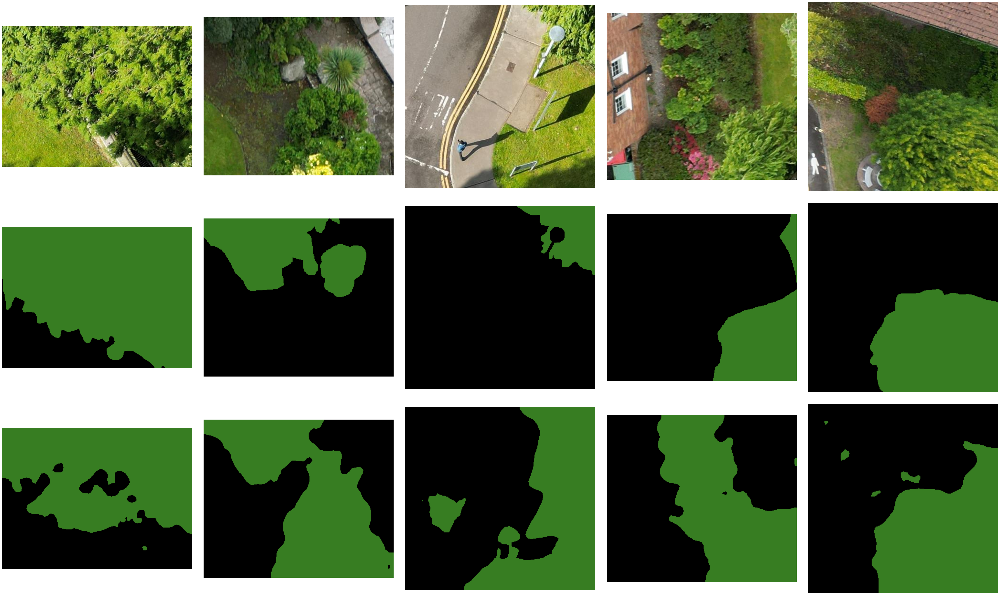

In [ ]:
lst = []
indices = random.sample(range(len(images)), k=5)
lst.extend([images[i] for i in indices])
lst.extend([mask_to_rgb(anns[i], {1: [55, 125, 34]}) for i in indices])
lst.extend([mask_to_rgb(preds[i], {1: [55, 125, 34]}) for i in indices])

show_in_grid(lst, num_rows=3, num_cols=int(len(lst) / 3), show_plot=True)

### Calculate the performance of the model from the predictions

In [ ]:
metrics = SMAPIoUMetric()

for ann, pred in zip(anns, preds):
  metrics.process(input={"gt": ann, "pred": pred})

metrics.compute_metrics(metrics.results)

{'aAcc': 80.58,
 'mIoU': 67.48,
 'mAcc': 80.98,
 'background__IoU': 67.47,
 'background__Acc': 86.6,
 'high_vegetation__IoU': 67.49,
 'high_vegetation__Acc': 75.35}